In [2]:
from visual_behavior.utilities import EyeTrackingData
from visual_behavior import database as db
import pandas as pd
import matplotlib.pyplot as plt

from multiprocessing import Pool

%matplotlib notebook
%widescreen

In [3]:
paths = [
    '/allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod4/specimen_962177507/ophys_session_995558073',
    '/allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod3/specimen_910267443/ophys_session_995560574',
    '/allen/aibs/technology/waynew/allen/programs/braintv/production/neuralcoding/prod55/specimen_973228439/ophys_session_995571612',
    '/allen/aibs/technology/waynew/allen/programs/braintv/production/neuralcoding/prod55/specimen_973228439/ophys_session_995545810',
    '/allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod3/specimen_910267443/ophys_session_995978667',
]

In [4]:
def get_raw_points_path(session_id,folder='/ssd1'):
    return glob.glob(os.path.join(folder,'eye_tracking','{}*1030000.h5'.format(session_id)))[0]

def get_ellipse_path(session_id,folder='/ssd1'):
    path = glob.glob(os.path.join(folder,'eye_tracking','{}*ellipse.h5'.format(session_id)))[0]
    return path

def get_movie_path(session_id,folder='/ssd1'):
    '''
    movie_type can be 'eye' or 'behavior'
    '''
    storage_dir = folder
    return glob.glob(os.path.join(storage_dir,'*video-1.avi'))[0]

def make_and_save_figure(path):
    print('loading data from {}'.format(path))
    session_id = os.path.split(path)[1][-9:]
    filepaths = {
        'ellipse_fits': get_ellipse_path(session_id,folder=path),
        'raw_tracking_points': get_raw_points_path(session_id,folder=path),
        'eye_movie':get_movie_path(session_id,folder=path),
    }
    ed = EyeTrackingData(session_id,filepaths=filepaths)
    print('making plot for {}'.format(path))
    fig,ax=plt.subplots(10,10,figsize=(15,13))
    
    frames = np.linspace(0,len(ed.ellipse_fits['pupil'])-1,100).astype(int)
    for ii,frame in enumerate(frames):
        axis = ax.flatten()[ii]
        axis.imshow(ed.get_annotated_frame(frame))
        axis.axis('off')
        axis.text(5,5,'frame {}'.format(frame),ha='left',va='top',color='yellow',fontsize=8)

    fig.tight_layout()
    plt.subplots_adjust(wspace=0,hspace=0,top=0.95)
    fig.suptitle('session ID = {}'.format(session_id))

    print('saving plot for {}'.format(path))
    fig.savefig(os.path.join(savepath,session_id+'.png'),dpi=150)

loading data from /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod4/specimen_962177507/ophys_session_995558073
making plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod4/specimen_962177507/ophys_session_995558073


<IPython.core.display.Javascript object>


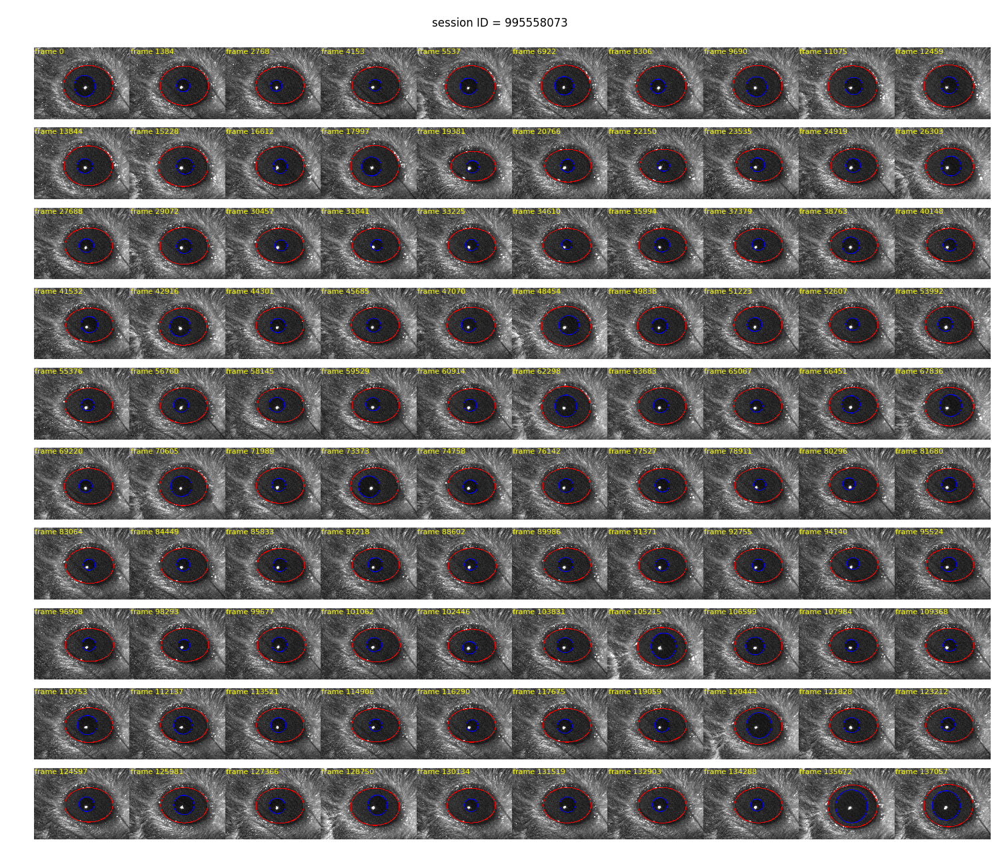

saving plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod4/specimen_962177507/ophys_session_995558073
loading data from /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod3/specimen_910267443/ophys_session_995560574
making plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod3/specimen_910267443/ophys_session_995560574


<IPython.core.display.Javascript object>


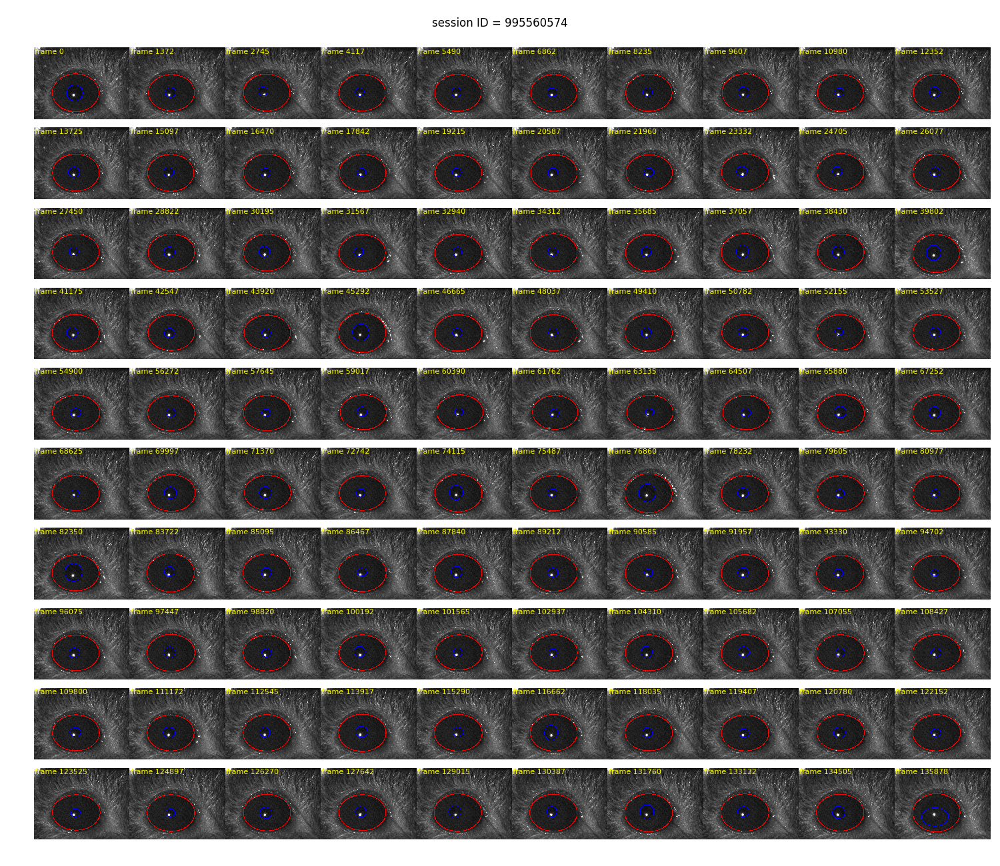

saving plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod3/specimen_910267443/ophys_session_995560574
loading data from /allen/aibs/technology/waynew/allen/programs/braintv/production/neuralcoding/prod55/specimen_973228439/ophys_session_995571612
making plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/neuralcoding/prod55/specimen_973228439/ophys_session_995571612


<IPython.core.display.Javascript object>


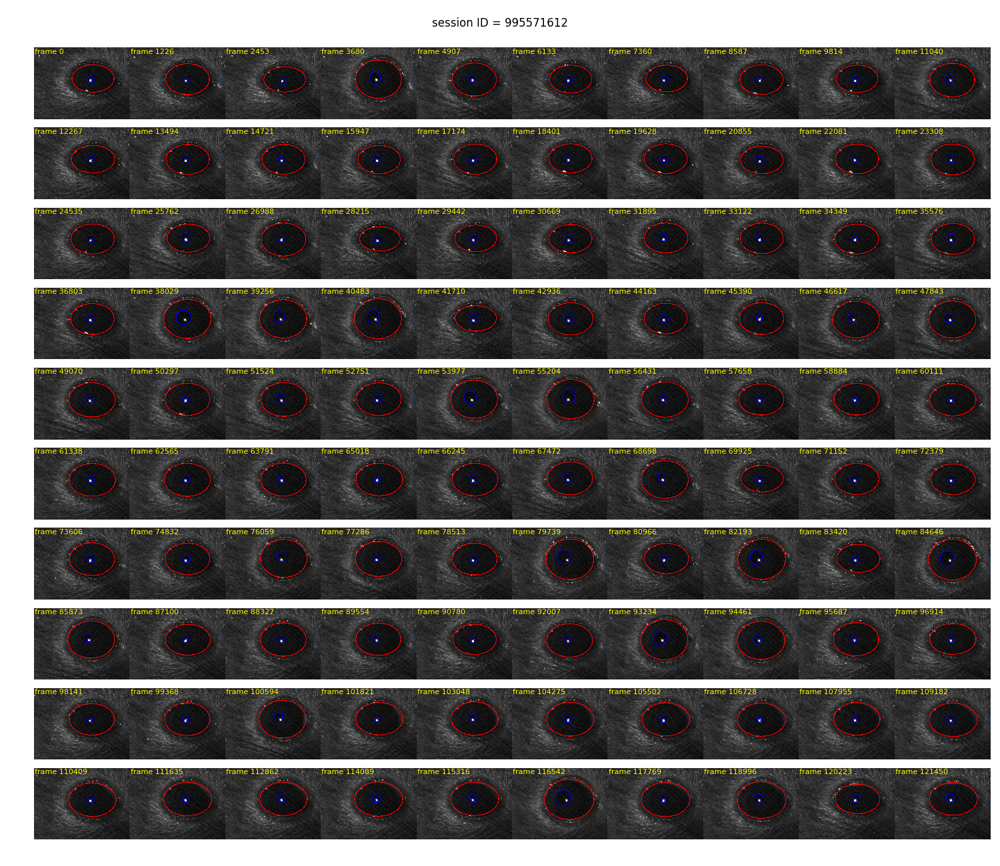

saving plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/neuralcoding/prod55/specimen_973228439/ophys_session_995571612
loading data from /allen/aibs/technology/waynew/allen/programs/braintv/production/neuralcoding/prod55/specimen_973228439/ophys_session_995545810
making plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/neuralcoding/prod55/specimen_973228439/ophys_session_995545810


<IPython.core.display.Javascript object>


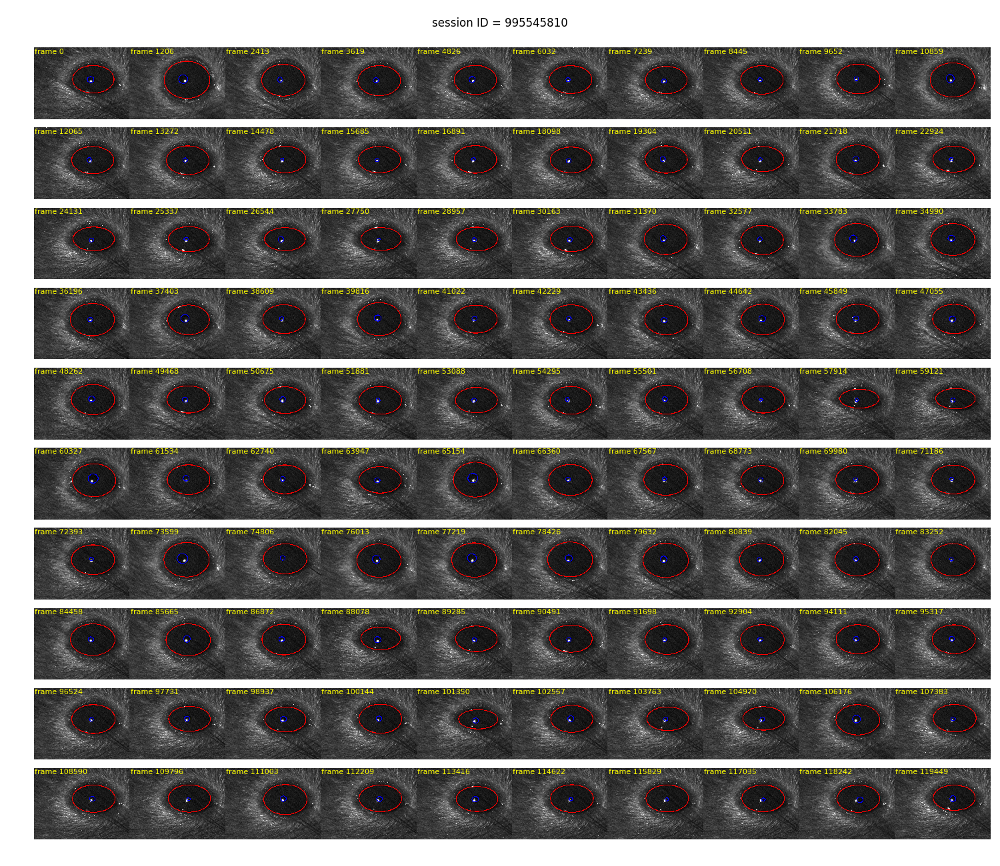

saving plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/neuralcoding/prod55/specimen_973228439/ophys_session_995545810
loading data from /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod3/specimen_910267443/ophys_session_995978667
making plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod3/specimen_910267443/ophys_session_995978667


<IPython.core.display.Javascript object>


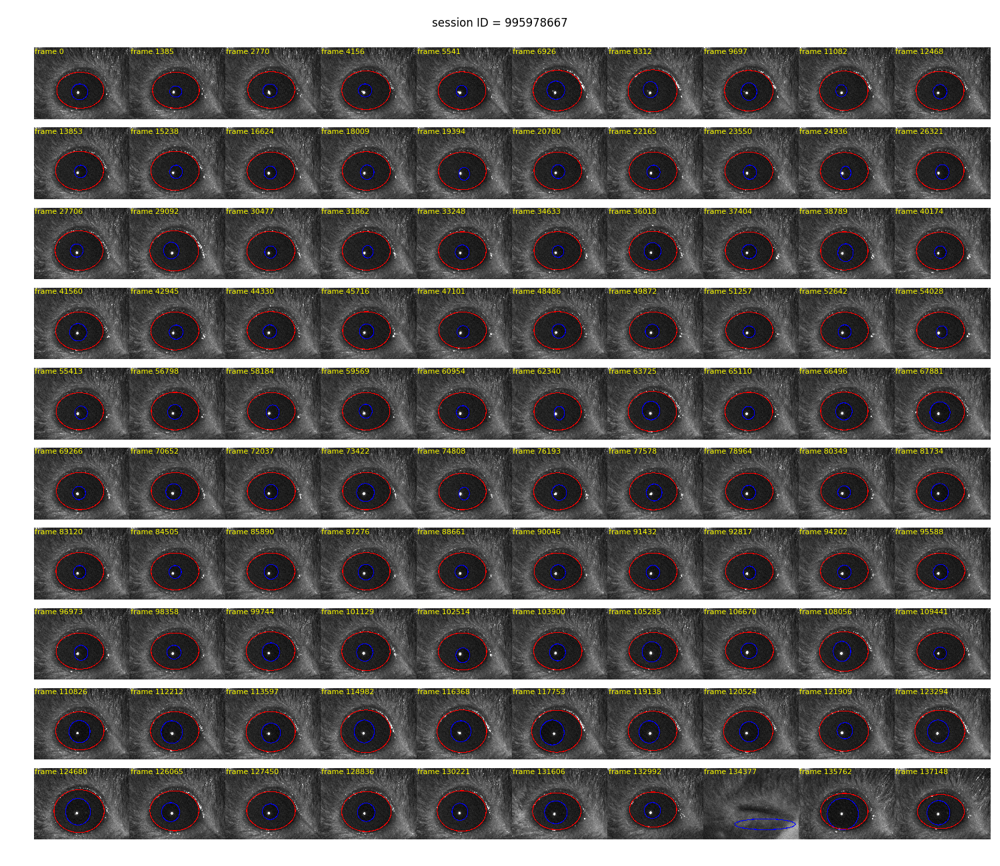

saving plot for /allen/aibs/technology/waynew/allen/programs/braintv/production/visualbehavior/prod3/specimen_910267443/ophys_session_995978667


In [5]:
savepath = '//allen/programs/braintv/workgroups/nc-ophys/Doug/2020.01.06_sample_eyetracking_plots'
# with Pool(16) as pool:
#     pool.map(make_and_save_figure,paths)
for path in paths:
    make_and_save_figure(path)